

---

* Dane obejmują cały rok 2017 i wszystkich operatorów.
* Podczas analizy przyjęta jest znajomość roku danych (wskaźników) dlatego infomacja ta nie jest podkreślana.
* Termin "stacja" odnosi się do stacji bazowej (BTS).



# Importy i ładowanie danych

In [4]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import missingno as msno
%matplotlib inline

from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

from scipy.cluster.hierarchy import dendrogram, linkage

In [5]:
pd.set_option('display.max_rows', 20)
sns.set(style='whitegrid')

In [6]:
date_parser = lambda x: pd.to_datetime(x, format='%d.%m.%Y %H:%M')

In [7]:
bts_anomalies = pd.read_excel('bts_anomalie_pct.xlsx')
bts = pd.read_csv('bts.csv', sep=',')
station_codes = pd.read_csv('kody_stacji.csv', encoding='cp1250', sep=';')
param_codes = pd.read_csv('kody_parametr.csv', encoding='cp1250', sep=';')

df_A_17_H1 = pd.read_csv('A_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_A_17_H2 = pd.read_csv('A_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_B_17_H1 = pd.read_csv('B_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_B_17_H2 = pd.read_csv('B_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_C_17_H1 = pd.read_csv('C_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_C_17_H2 = pd.read_csv('C_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_D_17 = pd.read_csv('D_2017.csv', encoding='cp1250', sep=';', decimal=',', dtype={'ID_stacji': int}, parse_dates=['Data_godzina'], date_parser=date_parser, nrows=191476)
df_E_17_H1 = pd.read_csv('E_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_E_17_H2 = pd.read_csv('E_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)

# Integracja danych

In [8]:
# Funkcja przekształca dane parametrów do wygodniejszej formy
# oraz uśrednia pomiary do wartości dobowych.
def prepare_and_average_daily_data(df1, df2=pd.DataFrame(), title=''):
  df = pd.concat([df1, df2])
  df.drop(columns=['Parametr'], inplace=True)
  df = df.groupby(['ID_stacji', df['Data_godzina'].dt.to_period('D')])['Wartość'].mean().reset_index()
  df['Wartość'] = round(df['Wartość'], 1)
  df.rename(columns={'Data_godzina': 'Data', 'Wartość': title}, inplace=True)
  return df

# Funkcja łączy ramki danych w jedną ramkę danych
# na podstawie określonego klucza i metody łączenia.
def merge_dfs(dataframes, on=None, how='inner'):
  result_df = dataframes[0]
  for df in dataframes[1:]:
    result_df = pd.merge(result_df, df, on=on, how=how)
  return result_df

# Funkcja dzieli ramkę danych na dwie ramki danych na podstawie maski logicznej.
def split_df_by_mask(df, mask):
  return df[~mask], df[mask]

In [9]:
# Przygotowanie ramki danych każdego parametru z osobna.

A = prepare_and_average_daily_data(df_A_17_H1, df_A_17_H2, 'Parameter_A')
B = prepare_and_average_daily_data(df_B_17_H1, df_B_17_H2, 'Parameter_B')
C = prepare_and_average_daily_data(df_C_17_H1, df_C_17_H2, 'Parameter_C')
D = prepare_and_average_daily_data(df_D_17, title='Parameter_D')
E = prepare_and_average_daily_data(df_E_17_H1, df_E_17_H2, 'Parameter_E')

In [10]:
# Połączenie wszystkich paramterów w jedną ramke danych.

params_list = [A, B, C, D, E]

df_params = merge_dfs(params_list, on=['ID_stacji', 'Data'], how='outer')
df_params = df_params.pivot(index='ID_stacji', columns='Data', values=['Parameter_A', 'Parameter_B', 'Parameter_C', 'Parameter_D', 'Parameter_E'])
df_params.columns = [f'{col[0]} {col[1]}' for col in df_params.columns]
df_params = df_params.reset_index()

In [11]:
# Funkcja łączy i przekształcanie danych z trzech różnych ramek danych.
def merge_and_transform(df_main, df_to_merge1, join_column1, join_column2, df_to_merge2, columns_to_drop, columns_to_rename, column_prefix):
  merged_df = pd.merge(df_main, df_to_merge1, how='left', left_on=join_column1, right_on=join_column2)
  merged_df = pd.merge(merged_df, df_to_merge2, on='bts_id')
  merged_df.drop(columns=columns_to_drop, inplace=True)
  merged_df.rename(columns=columns_to_rename, inplace=True)
  new_columns = list(merged_df.columns[:-12]) + [column_prefix + col for col in merged_df.columns[-12:]]
  merged_df.columns = new_columns
  return merged_df

In [12]:
# Sformatowanie kolumn łączących, które zawierają informacje o stacji oraz jej lokalizacji.

bts.lokalizacja = bts.lokalizacja.str.strip()
station_codes['Nazwa'] = station_codes['Nazwa'].str.title()

# Złączenie danych i utworzenie ramki zawierającej kompleksowe informacje o stacjach, ich lokalizacji, parametrach oraz awaryjności.

df_bts = station_codes.merge(df_params, how='outer', left_on='ID', right_on='ID_stacji')
df_bts = merge_and_transform(bts, df_bts, 'lokalizacja', 'Nazwa', bts_anomalies.iloc[:,:-12], ['ID', 'ID_stacji', 'Nazwa'], {'bts_id': 'ID_bts', 'siec': 'Network', 'standard': 'Standard','lokalizacja': 'Location', 'Szerokość geograficzna': 'Latitude', 'Długość geograficzna': 'Longitude'}, 'Anomaly ')

# Analiza zbiorów danych

In [13]:
# Sprawdzenie podstawowych informacji o strukturze danych.

df_bts.head()

,ID_bts,Network,Standard,Location,Latitude,Longitude,Parameter_A 2017-01-01,Parameter_A 2017-01-02,Parameter_A 2017-01-03,Parameter_A 2017-01-04,...,Anomaly 2017-03,Anomaly 2017-04,Anomaly 2017-05,Anomaly 2017-06,Anomaly 2017-07,Anomaly 2017-08,Anomaly 2017-09,Anomaly 2017-10,Anomaly 2017-11,Anomaly 2017-12
0,0,Konkurent_2,LTE IOT,Nowy Wiśnicz,NaN,NaN,NaN,NaN,NaN,NaN,...,0.11,0.10,0.08,0.15,0.00,0.10,0.11,0.02,0.10,0.03
1,1,Konkurent_2,GSM LTE,Piaski,NaN,NaN,NaN,NaN,NaN,NaN,...,0.12,0.12,0.09,0.10,0.12,0.07,0.15,0.06,0.13,0.02
2,2,Orange,GSM,Katowice,NaN,NaN,NaN,NaN,NaN,NaN,...,0.07,0.07,0.03,0.10,0.00,0.02,0.13,0.08,0.02,0.10
3,3,Konkurent_2,LTE,Sępopol,NaN,NaN,NaN,NaN,NaN,NaN,...,0.02,0.12,0.00,0.04,0.07,0.11,0.13,0.14,0.02,0.02
4,4,Konkurent_3,LTE,Debrzno,NaN,NaN,NaN,NaN,NaN,NaN,...,0.12,0.14,0.10,0.02,0.12,0.00,0.14,0.00,0.15,0.13


In [14]:
df_bts.shape

(10001, 1843)

In [15]:
df_bts.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10001 entries, 0 to 10000
Columns: 1843 entries, ID_bts to Anomaly 2017-12
dtypes: float64(1837), int64(1), object(5)
memory usage: 140.7+ MB


## Zmienne kategoryczne

In [16]:
print('Liczba unikalnych wartości:\n{}\n'.format(df_bts.iloc[:,:4].nunique()))
print('Liczba brakujących wartości:\n{}\n'.format(df_bts.iloc[:,:4].isnull().sum()))
print('Ogólne infomacje o kolumnach:')
df_bts.iloc[:,:4].info()

Liczba unikalnych wartości:
ID_bts      9918
Network        4
Standard      31
Location     916
dtype: int64

Liczba brakujących wartości:
ID_bts      0
Network     0
Standard    0
Location    0
dtype: int64

Ogólne infomacje o kolumnach:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 10001 entries, 0 to 10000
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID_bts    10001 non-null  int64 
 1   Network   10001 non-null  object
 2   Standard  10001 non-null  object
 3   Location  10001 non-null  object
dtypes: int64(1), object(3)
memory usage: 390.7+ KB


Analizując dane, zauważalne są rozbieżności pomiędzy strukturą ramki danych a numerami identyfikacyjnymi stacji, co prowadzi do przypuszczenia o istnieniu potencjalnych zduplikowanych rekordów. Ponadto, wysoka liczba unikalnych lokalizacji sugeruje, że w jednym obszarze geograficznym może znajdować się więcej niż jedna stacja pomiarowa.

## Zmienne numeryczne

In [17]:
# Wyselekcjonowanie z ramki danych lokalizacyjnych i eliminacja zduplikowanych wystąpień
# w celu ułatwienia eksploracji danych.

loc = df_bts.iloc[:, 3:6]
loc.drop_duplicates(inplace=True)
loc.reset_index(drop=True, inplace=True)
loc.head()

,Location,Latitude,Longitude
0,Nowy Wiśnicz,NaN,NaN
1,Piaski,NaN,NaN
2,Katowice,NaN,NaN
3,Sępopol,NaN,NaN
4,Debrzno,NaN,NaN


In [18]:
labels={'variable': 'Kolumna', 'index': 'Ilość współrzędnych', 'value': 'Liczba lokalizacji'}

fig = px.bar(loc['Location'].value_counts().value_counts(), labels=labels, title='Liczba lokalizacji według ilości współrzędnych')
fig.update_traces(marker_color='grey', showlegend=False)
fig.update_layout(xaxis_title='Ilość współrzędnych', yaxis_title='Liczba lokalizacji')
fig.show()

Z przedstawionego wykresu wynika, że w przypadku sześciu lokalizacji zaobserwowano występowanie dwóch par współrzędnych.

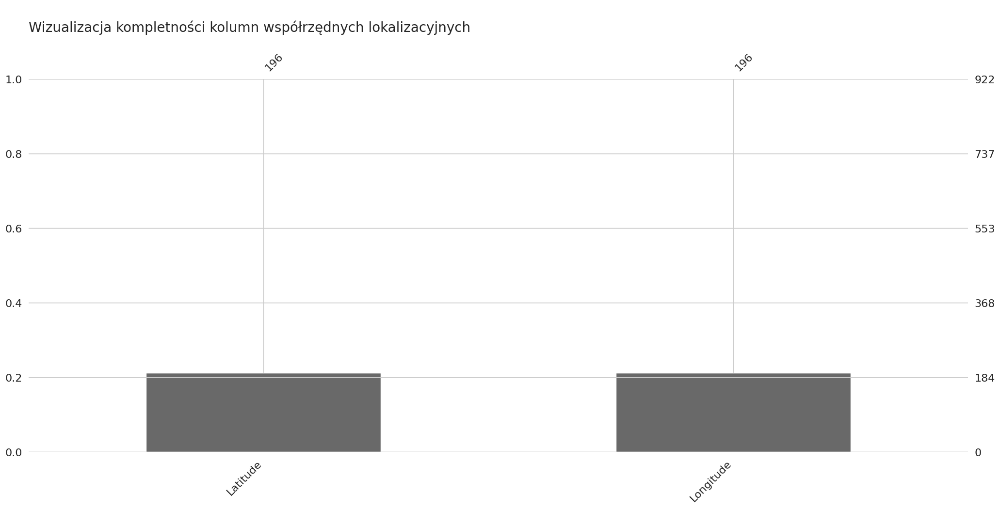

In [19]:
msno.bar(loc.iloc[:, 1:])
plt.title('\nWizualizacja kompletności kolumn współrzędnych lokalizacyjnych\n', fontsize=20, loc='left')
plt.show()

W przeważającej liczbie przypadków, aż 80% współrzędnych geograficznych posiada braki lub nieokreślone wartości, obejmujące zarówno szerokość, jak i długość geograficzną.

In [20]:
param_codes

,Kod,Nazwa
0,A,Temperatura powietrza
1,B,Temperatura gruntu
2,C,Średnia prędkość wiatru
3,D,Suma opadu dobowego
4,E,Wilgotność względna powietrza


In [21]:
weather_dict = {'Parameter_A': 'Temperatura powietrza', 'Parameter_B': 'Temperatura gruntu',
                'Parameter_C': 'Prędkość wiatru', 'Parameter_D': 'Opad',
                'Parameter_E': 'Wilgotność powietrza'}

In [22]:
param_cols = [k for k in df_params.columns if k.startswith('Parameter')]
anomaly_cols = [p for p in df_bts.columns if p.startswith('Anomaly')]

In [23]:
# Funkcja przetwarza ramkę danych do wygodniejszej formy
# poprzez przekształcenie kolumn w wiersze na podstawie określonych parametrów.
def melt_df(df, index_col, drop_cols, drop_cols2, date_cols):
  df_melt = df.drop(drop_cols, axis=1).drop(drop_cols2, axis=1)
  df_melt.drop_duplicates(subset=index_col, inplace=True)
  df_melt.set_index(index_col, inplace=True)
  df_melt = df_melt.reset_index()
  df_melt = df_melt.melt(id_vars=index_col, var_name='Column', value_name='Value')
  date = [x.split()[1] for x in df_melt['Column']]
  df_melt[date_cols] = [x.split('-') for x in date]
  df_melt['Column'] = [x.split()[0] for x in df_melt['Column']]
  return df_melt

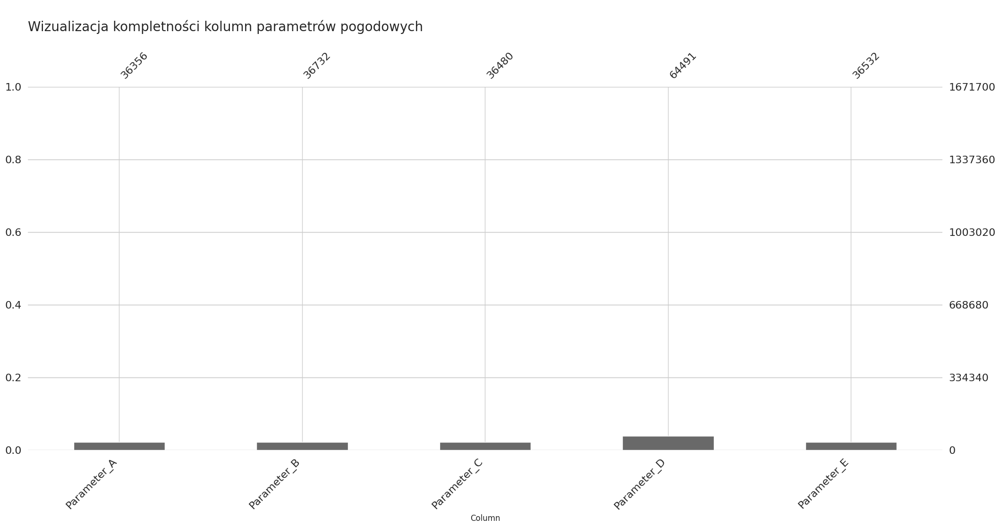

In [24]:
params = melt_df(df_bts, 'Location', ['ID_bts', 'Network', 'Standard', 'Latitude', 'Longitude'], anomaly_cols, ['Year', 'Month', 'Day']).reset_index()

msno.bar(params.pivot(columns='Column', values='Value'))
plt.title('\nWizualizacja kompletności kolumn parametrów pogodowych\n', fontsize=20, loc='left')
plt.show()

Analiza danych wskazuje, że średnio od 97% do 98% pomiarów codziennych parametrów pogodowych jest brakujących. Również każdy spośród pięciu parametrów wykazuje zbliżony stopień brakujących danych.

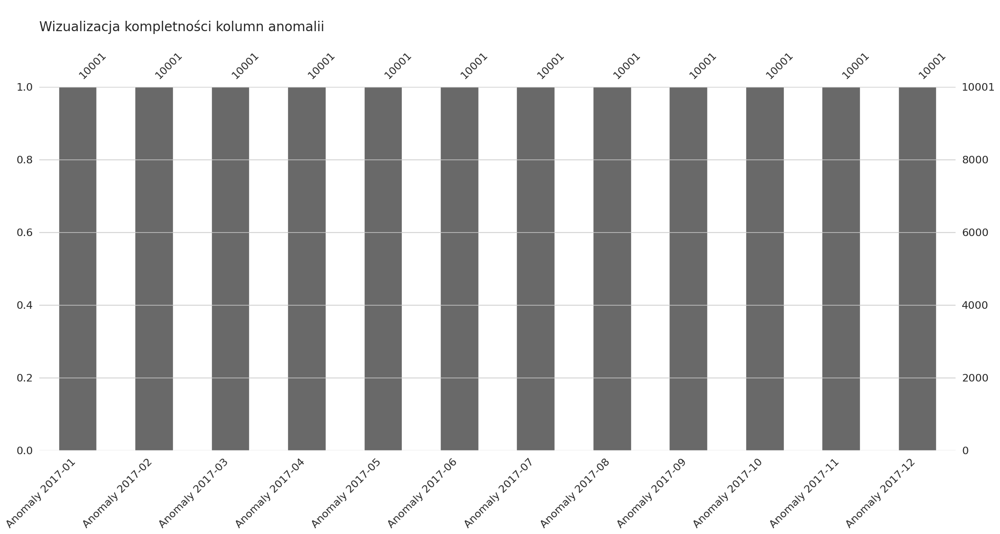

In [25]:
msno.bar(df_bts.iloc[:,-12:])
plt.title('\nWizualizacja kompletności kolumn anomalii\n', fontsize=20, loc='left')
plt.show()

Dla każdego miesiąca kolumny zawierające odsetki anomalii są w pełni uzupełnione.

# Czyszczenie danych

In [26]:
# Podział danych na dwa osobne zestawy rekordów
# jeden zawierający zduplikowane współrzędne geograficzne
# oraz te, które występują tylko raz.

duplicated = df_bts.drop(['Network', 'Standard'], axis=1).drop(anomaly_cols, axis=1).duplicated(subset='ID_bts', keep=False)
sub_unique, sub_double = split_df_by_mask(df_bts.drop(['Network', 'Standard'], axis=1).drop(anomaly_cols, axis=1), duplicated)

# Zastąpienie wartościami NaN wybrane kolumny danych i usunięcie duplikatów
# eliminując tym samym potencjalne błędy w danych.

group_cols = sub_double.groupby('Location')[param_cols].transform(lambda x: np.nan)
other_cols = sub_double.drop(param_cols, axis=1)
sub_double[param_cols] = group_cols
sub_double.drop(['ID_bts'], axis=1, inplace=True)
sub_double.drop_duplicates(subset='Location', inplace=True)

In [27]:
# Funkcja konwertuje stopnie, minuty i sekundy na stopnie dziesiętne.
def dms_to_decimal(dms):
  degrees, minutes, seconds = map(float, dms.split())
  decimal = degrees + minutes / 60 + seconds / 3600
  return decimal

# Funkcja geokoduje lokalizacje w ramce danych przy użyciu usługi geokodowania Nominatim.
def geocode_locations(df):
  geolocator = Nominatim(user_agent="user_agent")
  max_retries = 3

  locations = df.Location.unique()

  for location in locations:
    for _ in range(max_retries):
      try:
        data = geolocator.geocode(location + ", Polska", timeout=5)
        if data:
          df.loc[df['Location'] == location, 'Latitude'] = data.latitude
          df.loc[df['Location'] == location, 'Longitude'] = data.longitude
          break
      except GeocoderTimedOut:
        print(f"Geocoding timed out for location: {location}. Retrying...")
      except Exception as e:
        print(f"Error during geocoding for location {location}: {e}")

In [28]:
# Podział danych pozbawionych duplikatów na podzbiory, pod kryterium
# posiadanie obu współrzędnych geograficznych.

df_geo = sub_unique.drop(columns=['ID_bts'], axis=1).drop_duplicates(subset='Location')
non_geo = df_geo['Latitude'].isna() | df_geo['Longitude'].isna()
sub_geo, sub_non_geo = split_df_by_mask(df_geo, non_geo)

In [29]:
# Zastosowanie funkcji konwertującej stopnie, minuty i sekundy na stopnie dziesiętne
# na kolumnach szerokości i długości geograficznej w podzbiorze, który posiada obie wspołrzędne.

sub_geo['Latitude'] = sub_geo['Latitude'].apply(dms_to_decimal)
sub_geo['Longitude'] = sub_geo['Longitude'].apply(dms_to_decimal)

In [30]:
# Uzupełnianie współrzędnych geograficznych,
# zarówno dla zbioru z duplikatami, jak i dla podzbioru,
# który nie spełniał warunku posiadania obu współrzędnych,
# przez funkcje geokodują lokalizacje.

geocode_locations(sub_double)
geocode_locations(sub_non_geo)

In [31]:
df_loc = pd.concat([sub_double, sub_non_geo, sub_geo]).reset_index(drop=True)

In [32]:
# Podział ramki danych na dwa podzbiory - jeden zawierający rekordy
# posiadające wszystkie parametry pogodowe, a drugi obejmujący te,
# które mają przynajmniej jeden brak w którymś z parametrów.

empty = df_loc[param_cols].isna().any(axis=1)
sub_full, sub_empty = split_df_by_mask(df_loc, empty)

In [33]:
labels = {'Latitude': 'Szerokość geograficzna', 'Longitude': 'Długość geograficzna'}

fig = px.scatter_mapbox(sub_full, lat='Latitude', lon='Longitude', hover_name="Location", labels=labels, title='Lokalizacje w których znane są wszystkie parametry pogodowe', color_discrete_sequence=['grey'])
fig.update_layout(margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={"lat": 51.9, 'lon': 19.1}, mapbox_zoom=5, dragmode='lasso')
fig.show()

Rozlokowanie lokalizacji z pełnym zestawem parametrów na mapie jest równomierne na całym obszarze analizy.

In [34]:
# Funkcja wykorzystuje model k-najbliższych sąsiadów,
# do estymacji najbardziej zbliżonych wyników brakujących kolumn na podstawie najbliższych znanych danych.
def impute_with_knn(df_train, df_empty, train_columns, columns_to_impute, n_neighbors):
  training_data = df_train[train_columns]
  training_values = df_train[columns_to_impute]

  knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
  knn_model.fit(training_data, training_values)

  for index, row in df_empty.iterrows():
    train_values = [row[column] for column in train_columns]
    data = [train_values]
    imputed_values = knn_model.predict(data)
    for i, column_name in enumerate(columns_to_impute):
      if pd.isna(df_empty.at[index, column_name]):
        df_empty.at[index, column_name] = round(imputed_values[0][i], 1)

  return df_empty

In [35]:
# Zastosowanie imputacji danych, korzystając z modelu k-najbliższych sąsiadów,
# aby oszacować najbardziej podobny wynik danych pogodowych na podstawie współrzędnych geograficznych.

sub_empty = impute_with_knn(sub_full, sub_empty, ['Latitude', 'Longitude'], param_cols, 3)

In [36]:
# Złączenie danych i utworzenie ramki zawierającej kompleksowe informacje o stacjach, ich lokalizacji, parametrach oraz awaryjności.

df_loc = pd.concat([sub_full, sub_empty]).reset_index(drop=True)
df_bts = merge_and_transform(bts, df_loc, 'lokalizacja', 'Location', bts_anomalies.iloc[:,:-12], ['lokalizacja'], {'bts_id': 'ID_bts', 'siec': 'Network', 'standard': 'Standard'}, 'Anomaly ')
df_bts.head()

,ID_bts,Network,Standard,Location,Latitude,Longitude,Parameter_A 2017-01-01,Parameter_A 2017-01-02,Parameter_A 2017-01-03,Parameter_A 2017-01-04,...,Anomaly 2017-03,Anomaly 2017-04,Anomaly 2017-05,Anomaly 2017-06,Anomaly 2017-07,Anomaly 2017-08,Anomaly 2017-09,Anomaly 2017-10,Anomaly 2017-11,Anomaly 2017-12
0,0,Konkurent_2,LTE IOT,Nowy Wiśnicz,49.915267,20.462168,9.3,8.4,7.3,7.5,...,0.11,0.10,0.08,0.15,0.00,0.10,0.11,0.02,0.10,0.03
1,1,Konkurent_2,GSM LTE,Piaski,50.153203,19.475127,8.7,8.2,6.9,6.5,...,0.12,0.12,0.09,0.10,0.12,0.07,0.15,0.06,0.13,0.02
2,2,Orange,GSM,Katowice,50.259899,19.021585,9.0,8.1,7.4,6.4,...,0.07,0.07,0.03,0.10,0.00,0.02,0.13,0.08,0.02,0.10
3,3,Konkurent_2,LTE,Sępopol,54.264716,21.014646,5.8,5.7,6.9,4.8,...,0.02,0.12,0.00,0.04,0.07,0.11,0.13,0.14,0.02,0.02
4,4,Konkurent_3,LTE,Debrzno,53.53861,17.233868,7.7,8.4,6.8,5.0,...,0.12,0.14,0.10,0.02,0.12,0.00,0.14,0.00,0.15,0.13


# Porównanie sieci Orange z konkurencyjnymi sieciami

In [37]:
colors = {
    'Orange': 'darkorange',
    'Konkurent_1': 'lightgray',
    'Konkurent_2': 'gray',
    'Konkurent_3': 'darkgray'
}

In [38]:
network_counts = df_bts['Network'].value_counts().reset_index()

fig = px.bar(network_counts, x='index', y='Network', color='index', color_discrete_map=colors, labels={'index': 'Dostawca', 'Network': 'Ilość'})
fig.update_layout(title='Liczność stacji BTS poszczególnych dostawców', xaxis_title='Dostawca', yaxis_title='Liczba stacji')
fig.show()

In [39]:
# Funkcja zlicza ilość poszczególnych standardów obsługiwanych
# przez stacje u określonych operatorów sieciowych.
def count_network_standards(df):
  df_copy = df.copy()
  df_copy['Standard'] = df_copy['Standard'].str.strip().replace('\s+', ' ', regex=True)

  df_copy['GSM'] = 0
  df_copy['LTE'] = 0
  df_copy['UMTS'] = 0
  df_copy['5G'] = 0
  df_copy['IOT'] = 0

  for index, row in df_copy.iterrows():
    if 'GSM' in row['Standard']:
      df_copy.at[index, 'GSM'] = 1
    if 'LTE' in row['Standard']:
      df_copy.at[index, 'LTE'] = 1
    if 'UMTS' in row['Standard']:
      df_copy.at[index, 'UMTS'] = 1
    if '5G' in row['Standard']:
      df_copy.at[index, '5G'] = 1
    if 'IOT' in row['Standard']:
      df_copy.at[index, 'IOT'] = 1

  network_standard_counts = df_copy.groupby('Network')[['GSM', 'LTE', 'UMTS', '5G', 'IOT']].sum().reset_index()
  return pd.melt(network_standard_counts, id_vars='Network', var_name='Standard', value_name='Count')

In [40]:
network_standards_counts = count_network_standards(df_bts.iloc[:, 1:3])
labels = {'Network': 'Operator', 'Count': 'Ilość'}

fig = px.bar(network_standards_counts, x='Standard', y='Count', color='Network', barmode='group', color_discrete_map=colors, labels=labels)
fig.update_layout(title='Liczność obsługiwanych standardów w stacjach BTS u poszczególnych operatorów', xaxis_title='Standard', yaxis_title='Ilość')
fig.update_traces(marker=dict(line=dict(color='black', width=0.01)))
fig.show()

Widoczna jest przewaga liczby stacji operatora Orange nad pozostałymi, zwłaszcza w przypadku standardów LTE, GSM i UMTS.

In [41]:
fig = px.scatter_mapbox(df_bts, lat="Latitude", lon="Longitude", hover_name="Location", color='Network', color_discrete_map=colors, title="Lokalizacje stacji BTS poszczególnych operatorów", labels={'Network': 'Operator'})
fig.update_layout(margin={"r": 0, "t": 50, "l": 0, "b": 0}, mapbox_style='carto-positron', mapbox_center={"lat": 51.9, "lon": 19.1}, mapbox_zoom=5,  dragmode='lasso')
fig.show()

Lokalizacje stacji operatorów są równomiernie rozproszone na obszarze objętym analizą.

In [42]:
months_dict = {'01': 'Styczeń', '02': 'Luty', '03': 'Marzec', '04': 'Kwiecień', '05': 'Maj', '06': 'Czerwiec',
               '07': 'Lipiec', '08': 'Sierpień', '09': 'Wrzesień', '10': 'Październik', '11': 'Listopad', '12': 'Grudzień'}

In [43]:
df_network_anomaly = df_bts.groupby('Network')[anomaly_cols].mean().reset_index()
df_network_anomaly.columns = [f"{months_dict[col.split('-')[1]]}" if col.startswith('Anomaly') else col for col in df_network_anomaly.columns]
df_network_anomaly = pd.melt(df_network_anomaly, id_vars='Network', var_name='Anomaly', value_name='Value')

labels = {'Network': 'Operator', 'Anomaly': 'Miesiąc', 'Value': 'Uśredniony odestek anomalii'}

fig = px.bar(df_network_anomaly, x='Anomaly', y='Value', color='Network', color_discrete_map=colors, title='Średnia miesięczna awaryjność w stacjach BTS u poszczególnych operatorów', barmode='group', labels=labels)
fig.show()

Analiza wykazuje, że średnie miesięczne odsetki anomalii są zauważalnie podobne w różnych stacjach, utrzymując się na stałym poziomie w okolicach 0.075.

# Pogoda

In [44]:
# Odseparowanie danych od parametrów pogodowych.

data = df_bts.drop(['ID_bts','Network', 'Standard'], axis=1)
data.drop_duplicates(subset='Location', inplace=True)
loc = data.iloc[:,:3]

In [45]:
def group_and_agg(df, group_cols, aggs, value):
    df_agg = (df.groupby(group_cols)[value].agg(aggs)).reset_index()
    return df_agg

In [46]:
# Skonsolidowanie rekordów parametrów pogodowych z pomiarów dobowych
# na miesięczne i roczne, używając miar agregacyjnych.
# Proces ma na celu umożliwienie lepszego dostosowania odpowiednich miar do poszczególnych parametrów.

df_params = melt_df(data, 'Location', ['Longitude', 'Latitude'], anomaly_cols, ['Year', 'Month', 'Day'])

params_month_agg = group_and_agg(df_params, ['Column', 'Location', 'Year', 'Month'], [np.min, np.max, np.mean, np.sum], 'Value')
params_month_agg['range'] = params_month_agg['amax'] - params_month_agg['amin']
params_year_agg = group_and_agg(df_params, ['Column', 'Location', 'Year'], [np.min, np.max, np.mean, np.sum], 'Value')
params_year_agg['range'] = params_year_agg['amax'] - params_year_agg['amin']

In [47]:
# Funkcja przygotowuje dane dotyczące parametrów na podstawie ramki danych do wygodniejszej formy.
def prepare_parameter_data(data, params, col1_drop, col2_drop, col1, col2):
  params_1, params_2 = split_df_by_mask(data, data['Column'].isin(params))
  params_1.drop(col1_drop, axis=1, inplace=True)
  params_1.rename(columns={col1: 'Value'}, inplace=True)
  params_2.drop(col2_drop, axis=1, inplace=True)
  params_2.rename(columns={col2: 'Value'}, inplace=True)
  df = pd.concat([params_1, params_2])
  df = loc.merge(df, on='Location')
  return df

## Średnie wartości pogodowe

In [48]:
# Funkcja wykonuje normalizację wybranych kolumn
# za pomocą Min-Max Scaling dla lepszej spójności i analizy danych.
def normalize_columns(df, columns_to_normalize):
  df_normalized = df.copy()
  scaler = MinMaxScaler()

  for column in columns_to_normalize:
    if column in df.columns:
      df_normalized[column] = scaler.fit_transform(df[[column]])

  return df_normalized

In [49]:
params_month_mean = prepare_parameter_data(params_month_agg, ['Parameter_D'], ['amin', 'amax', 'range', 'sum'], ['amin', 'amax', 'range', 'mean'], 'mean', 'sum')

params_month_mean_norm = params_month_mean.drop(['Latitude', 'Longitude', 'Year'], axis=1).pivot(index=['Location', 'Month'], columns='Column', values='Value').reset_index()
params_month_mean_norm = normalize_columns(params_month_mean_norm, list(weather_dict.keys()))
params_month_mean_norm = pd.melt(params_month_mean_norm, id_vars=['Location', 'Month'], var_name='Column', value_name='Value')
params_month_mean_norm = pd.DataFrame(params_month_mean_norm.groupby(['Month', 'Column'])['Value'].agg('mean')).rename(columns={'Value': 'Mean'})
params_month_mean_norm.reset_index(inplace=True)
params_month_mean_norm.replace(weather_dict, inplace=True)
params_month_mean_norm.replace(months_dict, inplace=True)
params_month_mean_norm.rename(columns={'Column': 'Parametr', 'Month': 'Miesiąc'}, inplace=True)

fig = px.bar(params_month_mean_norm, x='Miesiąc', y='Mean', color='Parametr', color_discrete_map=colors, barmode='group',
             title='Rozkład średnich miesięcznych wartości parametrów pogodowych', labels={'Mean': 'Znormalizowana średnia wartość'})
fig.show()

In [50]:
# Funkcja generująca interaktywny wykres mapy,
# umożliwiająca dynamiczną analizę zmian przestrzennych i czasowych dla poszczególnych kategorii.
def plot_map_group(df1, param, title,  group):

  range_color_dict = {}
  unique_groups = df1[group].unique()

  for unique_group in unique_groups:
    range_color_min = df1[df1[group] == unique_group][param].min()
    range_color_max = df1[df1[group] == unique_group][param].max()
    range_color_dict[unique_group] = [range_color_min, range_color_max]

  fig = px.scatter_mapbox(
    df1, lat='Latitude', lon='Longitude',
    color=param, hover_name='Location', animation_group=group,
    animation_frame=group, range_color=range_color_dict.get(df1[group].iloc[0]),
    title=title, opacity=0.6, color_continuous_scale='Viridis_r',
    labels={'Latitude': 'Szerokość geograficzna', 'Longitude': 'Długość geograficzna', param: 'Wartość'})

  fig.update_layout(
    margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron',
    mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')

  fig.update_coloraxes(cauto=True)
  fig.show()

In [51]:
params_year_vis = prepare_parameter_data(params_year_agg, ['Parameter_D'], ['amin', 'amax', 'range', 'sum'], ['amin', 'amax', 'range', 'mean'], 'mean', 'sum')
params_year_vis.rename(columns={'Column': 'Parametr'}, inplace=True)
params_year_vis['Parametr'].replace(weather_dict, inplace=True)
plot_map_group(params_year_vis, 'Value', 'Wizualizacja średnich wartości parametrów pogodowych', 'Parametr')

In [52]:
params_month_vis = params_month_mean.drop('Year', axis=1)
params_month_vis.rename(columns={'Column': 'Parametr', 'Month': 'Miesiąc'}, inplace=True)
params_month_vis.replace(weather_dict, inplace=True)
params_month_vis.replace(months_dict, inplace=True)

In [53]:
# Funkcja wizualiząca dane miesięczne dla poszczególnych parametrów pogodowych.
def param_month_visualize(df, params, titles):
  for i in range(len(params)):
    plot_map_group(df[df['Parametr'] == params[i]], 'Value', titles[i], 'Miesiąc')

In [54]:
param_month_visualize(params_month_vis, list(weather_dict.values()), list(weather_dict.values()))

## Ekstremalne wartości pogodowe

In [55]:
# Funkcja identyfikuje wartości skrajne w określonej kolumnie
# na podstawie średniej i odchylenia standardowego.
def extreme_values(df, col, value):
  data = df[df['Column'] == col]
  mean = data[value].mean()
  std = data[value].std()
  extreme_limit = mean + 3 * std
  extreme_values = (data[value] > extreme_limit)
  return data[extreme_values]

# Funkcja identyfikuje lokalizacje
# w których występują skrajne wartości.
def extreme_loc(df, params, col):
  extreme_loc = pd.DataFrame()
  for param in params:
    ex = extreme_values(df, param, col)
    extreme_loc = pd.concat([extreme_loc, ex])

  return extreme_loc

In [56]:
extreme_params_year = prepare_parameter_data(params_year_agg, ['Parameter_C', 'Parameter_D', 'Parameter_E'],
                                    ['amin', 'amax', 'mean', 'sum'], ['amin', 'amax', 'range', 'mean'], 'range', 'sum')

extreme_params_month = prepare_parameter_data(params_month_agg, ['Parameter_C', 'Parameter_D', 'Parameter_E'],
                                    ['amin', 'amax', 'mean', 'sum'], ['amin', 'amax', 'range', 'mean'], 'range', 'sum')

In [57]:
extreme_year_loc = extreme_loc(extreme_params_year, list(weather_dict.keys()), 'Value')

labels = {'Latitude': 'Szerokość geograficzna', 'Longitude': 'Długość geograficzna'}

fig = px.scatter_mapbox(extreme_year_loc, lat='Latitude', lon='Longitude', hover_name="Location", color_discrete_sequence=['grey'], labels=labels,
                        title='Lokalizacje charakteryzujące się najbardziej znaczącymi amplitudami lub ekstremalnymi wartościami w przedziale rocznym')

fig.update_layout(margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={"lat": 51.9, 'lon': 19.1}, mapbox_zoom=5, dragmode='lasso')
fig.show()

In [58]:
extereme_month_loc = extreme_loc(extreme_params_month, list(weather_dict.keys()), 'Value')
extereme_month_loc = extereme_month_loc.sort_values(by='Month')
extereme_month_loc.rename(columns={'Month': 'Miesiąc'}, inplace=True)
extereme_month_loc.replace(months_dict, inplace=True)

labels = {'Latitude': 'Szerokość geograficzna', 'Longitude': 'Długość geograficzna'}

fig = px.scatter_mapbox(extereme_month_loc, lat='Latitude', lon='Longitude', hover_name="Location", color_discrete_sequence=['grey'], animation_group='Miesiąc', animation_frame='Miesiąc',
                        title='Lokalizacje charakteryzujące się najbardziej znaczącymi amplitudami lub ekstremalnymi wartościami w przedziale miesiącznym', labels=labels)

fig.update_layout( margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')
fig.show()

# Awaryjność

In [61]:
# Odseparowanie danych odnośnych awaryjności.

df_anomaly = df_bts.iloc[:, [0,3] + list(range(-12, 0))]
df_anomaly.columns = [f"{col.split('-')[1]}" if col.startswith('Anomaly') else col for col in df_anomaly.columns]

In [63]:
# Wygenerowanie podstawowych statystyk opisowych

df_anomaly.iloc[:, -12:].describe()

,01,02,03,04,05,06,07,08,09,10,11,12
count,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000
mean,0.075358,0.074733,0.074992,0.075390,0.075202,0.075041,0.075687,0.075208,0.075242,0.074538,0.075364,0.074903
std,0.045873,0.046129,0.045936,0.046111,0.046185,0.046278,0.045547,0.045798,0.046391,0.046027,0.046036,0.046024
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.030000,0.040000,0.040000,0.030000,0.040000,0.040000,0.030000,0.030000,0.040000,0.030000
50%,0.080000,0.070000,0.080000,0.080000,0.080000,0.080000,0.080000,0.080000,0.080000,0.070000,0.080000,0.080000
75%,0.110000,0.110000,0.110000,0.120000,0.120000,0.110000,0.110000,0.110000,0.120000,0.110000,0.120000,0.117500
max,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000


In [65]:
fig = px.box(df_anomaly.iloc[:, -12:], title='Rozkład statystyczny awaryjności - analiza miesięczna', labels={'variable': 'Miesiąc', 'value': 'Wartość'})
fig.show()

Analiza średnich miesięcznych odsetków anomali w danych pogodowych ukazuje względną stabilność na poziomie około 0.08. Mimo pewnej zmienności, wartości utrzymują się w ograniczonym zakresie, co sugeruje regularność w rozkładzie danych.

In [66]:
df_anomaly = pd.melt(df_anomaly, id_vars=['ID_bts', 'Location'], var_name='Anomaly', value_name='Value')

In [67]:
df_anomaly_count = pd.DataFrame(df_anomaly.groupby('Anomaly')['Value'].value_counts()).rename(columns={'Value': 'Count'})
df_anomaly_count.reset_index(inplace=True)
df_anomaly_count.rename(columns={'Anomaly': 'Miesiąc', 'Value': 'Wartość'}, inplace=True)
df_anomaly_count['Wartość'] = df_anomaly_count['Wartość'].astype(str)
df_anomaly_count.sort_values(by=['Wartość', 'Miesiąc'], inplace=True)
df_anomaly_count.replace(months_dict, inplace=True)

fig = px.bar(df_anomaly_count, x='Miesiąc', y='Count', color='Wartość', color_discrete_map=colors, barmode='group',
             title='Rozkład miesięczny liczby stacji BTS doświadczających poszczególnych wartości odsetków anomalii')
fig.show()

Otrzymane wyniki nie wykazują jednoznacznej zależności w poszczególnych miesiącach.

In [68]:
df_anomaly = loc.merge(df_anomaly, on='Location')
df_anomaly.sort_values(by=['Anomaly'], inplace=True)
df_anomaly.replace(months_dict, inplace=True)
df_anomaly.rename(columns={'Anomaly': 'Miesiąc'}, inplace=True)

# Wybrany próg, oparty na 75% percentylu, pozwoli na identyfikację miejsc, gdzie występują istotne odchylenia od ogólnej tendencji danych.

labels = {'Latitude': 'Szerokość geograficzna', 'Longitude': 'Długość geograficzna'}

fig = px.scatter_mapbox(df_anomaly[df_anomaly['Value'] > 0.12],lat='Latitude', lon='Longitude', hover_name="Location", color_discrete_sequence=['grey'], animation_group='Miesiąc', animation_frame='Miesiąc',
                        title='Lokalizacje stacji w których odnotowano odsetki anomalii przekraczające 0.12', labels=labels)

fig.update_layout( margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')
fig.show()

Wyniki analizy wskazują, że stacje, których wartości odsetek anomalii przekraczają próg 0.12, są równomiernie rozproszone po całym badanym obszarze. Bez wyraźnego skupienia w konkretnych regionach. Takie rozłożenie może sugerować, że anomalia występują bez znaczącego związku z konkretnymi obszarami geograficznymi.

# Identyfikacja stacji o podobnych warunkach pogodowych i awaryjności

In [70]:
# Funkcja przygotowująca ramkę danych do klasteryzacji.
def prepare_df_to_clustering(df):
  parameters = df
  parameters['Month'] = parameters['Month'].astype(int)
  parameters = parameters.pivot(index='Location', columns=['Column', 'Month'])
  value = 'Value'
  parameters = parameters[value]
  parameters.columns = [f"{col[0]} {col[1]}" for col in parameters.columns]

  df_for_clustering = df_bts.iloc[:,:4].merge(parameters, on='Location')
  df_for_clustering = df_for_clustering.merge(bts_anomalies.iloc[:,:-12], left_on='ID_bts', right_on='bts_id')
  df_for_clustering.drop('bts_id', axis=1, inplace=True)
  df_for_clustering.columns = list(df_for_clustering.columns[:-12]) + [f"Anomaly {int(col.split('-')[1]):01d}" for col in df_for_clustering.columns[-12:]]
  df_for_clustering = df_for_clustering.merge(loc, on='Location')

  return df_for_clustering

In [71]:
# Funkcja obliczająca korelację między kolumnami parametrów i anomalii.
def calculate_correlation(df):
  df_corr = df.melt(id_vars=['ID_bts'], var_name='Column', value_name='Value')
  df_corr[['Column','Month']] = [x.split() for x in df_corr['Column']]
  df_corr = df_corr.pivot(index=['ID_bts', 'Month'], columns=['Column'], values='Value').reset_index()
  return df_corr[list(df_corr.iloc[:,-6:].columns)].corr()

In [72]:
df_cluster = prepare_df_to_clustering(params_month_mean)

In [73]:
correlation = calculate_correlation(df_cluster.drop(['Network', 'Standard', 'Location', 'Longitude', 'Latitude'], axis=1))

fig = px.imshow(correlation, text_auto=True, aspect='auto', color_continuous_scale='Blues', title='Mapa korelacji między anomaliami a poszczególnymi parametrami pogodowymi')
fig.show()

 Na podstawie analizy macierzy korelacji nie wykazano silnych związków między anomaliami a poszczególnymi parametrami. Wszystkie wartości korelacji są bliskie zeru, co sugeruje brak wyraźnych korelacji.

In [74]:
# Funkcja normalizująca dane przy użyciu Standard Scaler.
def normalize_data(data):
  scaler = StandardScaler()
  data_normalized = scaler.fit_transform(data)
  return data_normalized

In [75]:
# Funkcja klastrowania i oceny klastrów przy użyciu wybranego algorytmu (Agglomerative Clustering lub KMeans)
# dla różnych liczności klastrów.
def cluster_and_evaluate(data, algorithm, n_clusters, method='ward'):
  score_list = []
  X = normalize_data(data)
  for n in n_clusters:
    if algorithm == 'agglomerative':
      model = AgglomerativeClustering(n_clusters=n, linkage=method)
    elif algorithm == 'kmeans':
      model = KMeans(n_clusters=n)

    clusters = model.fit_predict(X)
    data['Cluster'] = clusters

    silhouette = silhouette_score(X, clusters)
    davies_bouldin = davies_bouldin_score(X, clusters)
    calinski_harabasz = calinski_harabasz_score(X, clusters)
    cluster_counts = data['Cluster'].value_counts().sort_index()

    score_list.append((n, silhouette, davies_bouldin, calinski_harabasz, cluster_counts, clusters))

  return score_list

In [76]:
# Funkcja wizualizująca na wykresach porównywania wyników różnych metryk jakości klastrów.
def plot_scores_comparison(n_clusters, score_lists, labels):
  silhouette_scores = [[x[1] for x in score] for score in score_lists]
  davies_bouldin_scores = [[x[2] for x in score] for score in score_lists]
  calinski_harabasz_scores = [[x[3] for x in score] for score in score_lists]

  fig, ax = plt.subplots()
  for i, scores in enumerate(silhouette_scores):
    sns.lineplot(x=n_clusters, y=scores, label=labels[i], ax=ax)
  ax.set(xlabel='Iterations', ylabel='Score')
  plt.title('Silhouette Scores')
  plt.legend(title='Legend')
  plt.show()

  fig, ax = plt.subplots()
  for i, scores in enumerate(davies_bouldin_scores):
    sns.lineplot(x=n_clusters, y=scores, label=labels[i], ax=ax)
  ax.set(xlabel='Iterations', ylabel='Score')
  plt.title('Davies-Bouldin Scores')
  plt.legend(title='Legend')
  plt.show()

  fig, ax = plt.subplots()
  for i, scores in enumerate(calinski_harabasz_scores):
    sns.lineplot(x=n_clusters, y=scores, label=labels[i], ax=ax)
  ax.set(xlabel='Iterations', ylabel='Score')
  plt.title('Calinski-Harabasz Scores')
  plt.legend(title='Legend')
  plt.show()

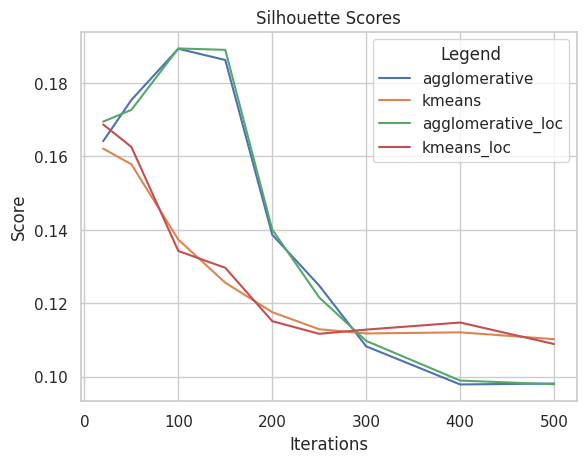

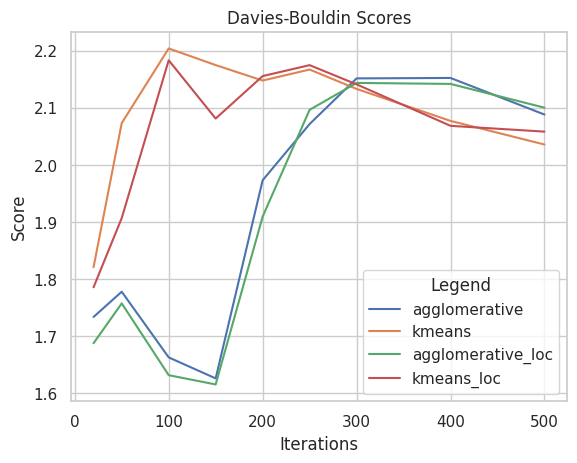

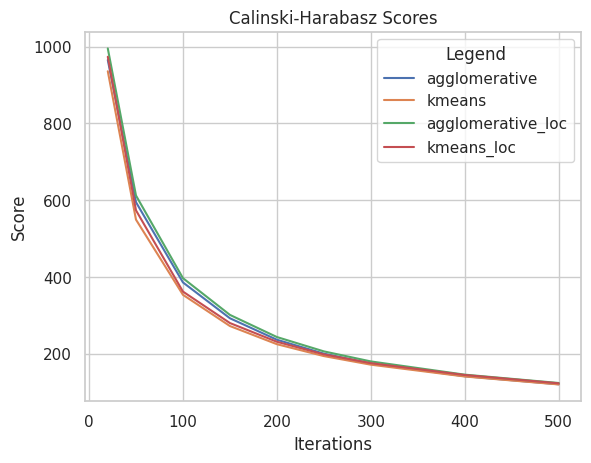

In [ ]:
n_clusters = [20, 50, 100, 150, 200, 250, 300, 400, 500]

# Wyodrębnienie danych do analizy klastrów (z uwzględnieniem lokalizacji i bez)

data = df_cluster.drop(['ID_bts', 'Network', 'Standard', 'Location', 'Latitude', 'Longitude'], axis=1)
data_loc = df_cluster.drop(['ID_bts', 'Network', 'Standard', 'Location'], axis=1)

# Analiza klastrów z użyciem różnych algorytmów

scores = []
scores.append(cluster_and_evaluate(data, 'agglomerative', n_clusters))
scores.append(cluster_and_evaluate(data, 'kmeans', n_clusters))
scores.append(cluster_and_evaluate(data_loc, 'agglomerative', n_clusters))
scores.append(cluster_and_evaluate(data_loc, 'kmeans', n_clusters))

plot_scores_comparison(n_clusters, scores, ['Agglomerative', 'KMeans', 'Agglomerative_loc', 'KMeans_loc'])

Analiza wykresów wyników jednoznacznie wskazuje na lepsze wyniki danych lokalizacyjnych w porównaniu do danych, które ich. Sugeruje to, że lokalizacja jest kluczowym czynnikiem wpływającym na ilość współrzędnych. Dodatkowo, zauważalne jest, że algorytm agglomerative osiąga lepsze rezultaty niż KMeans w identyfikacji stacji o podobnych warunkach pogodowych i awaryjności. To z kolei sugeruje potencjalną efektywność algorytmu agglomerative w rozwiązaniu tego konkretnego problemu. Dodatkowo, najlepsze wyniki uzyskano przy liczbie klastrów wynoszących około 100, co wskazuje na optymalną liczbę klastrów dla tego zbioru danych.

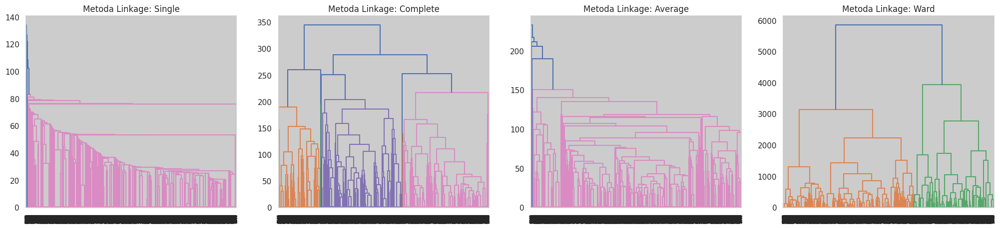

In [125]:
data = df_cluster.drop(['ID_bts', 'Network', 'Standard', 'Location'], axis=1)

methods = ['single', 'complete', 'average', 'ward']
plt.figure(figsize=(25, 5))

for i, method in enumerate(methods, 1):
    plt.subplot(1, 4, i)
    Z = linkage(data, method)
    dendrogram(Z)
    plt.title(f'Metoda Linkage: {method.capitalize()}')

plt.show()

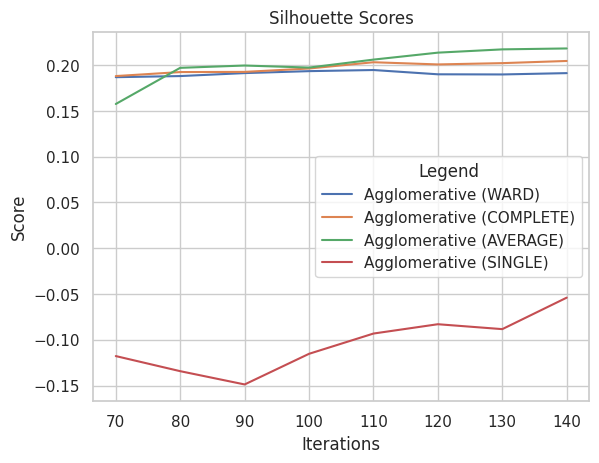

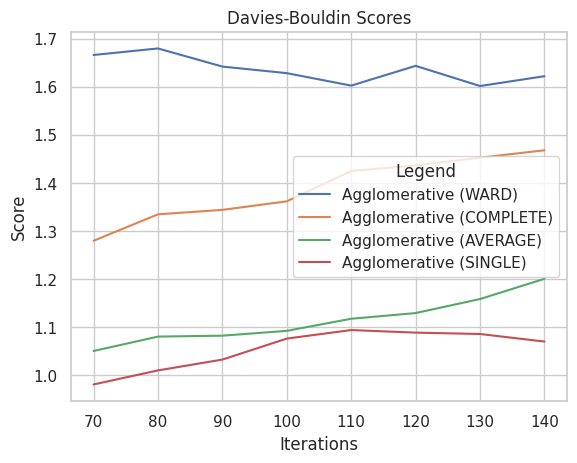

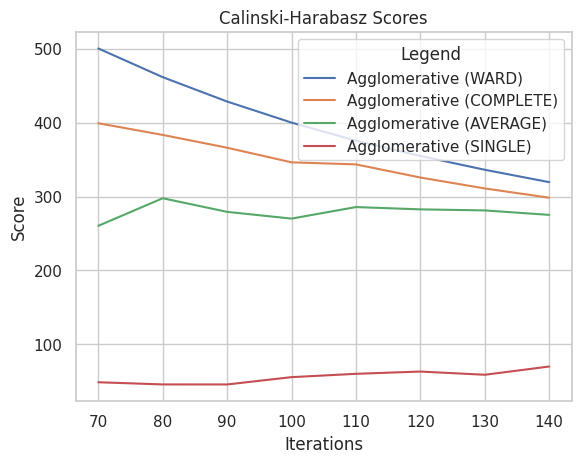

In [74]:
n_clusters = range(70, 150, 10)

scores_agglomerative = []
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'ward'))
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'complete'))
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'average'))
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'single'))

plot_scores_comparison(n_clusters, scores_agglomerative, ['Agglomerative (WARD)', 'Agglomerative (COMPLETE)', 'Agglomerative (AVERAGE)', 'Agglomerative (SINGLE)'])

W wyniku analizy można jednoznacznie stwierdzić, że algorytm agglomerative osiąga najlepsze wyniki, gdy korzysta z metody łączenia klastrów "complete" oraz "average". Oba przypadki prezentują wyraźnie lepsze rezultaty w porównaniu do innych metod łączenia klastrów. Co istotne, optymalna liczba klastrów, wynosząca 110, potwierdza się jako najefektywniejszy wybór dla algorytmu agglomerative, co sugeruje, że ta liczba sprzyja równomiernemu i efektywnemu klastrowaniu

In [90]:
clusters_count_complete = scores_agglomerative[1][4][4]
clusters_count_average = scores_agglomerative[2][4][4]

In [124]:
fig_c = px.bar(clusters_count_complete, labels={'value': 'Ilość stacji', 'index': 'Klaster'}, title ='Ilość stacji BTS w poszczególnych skupiskach - metoda COMPLETE')
fig_c.show()
fig_a = px.bar(clusters_count_average, labels={'value': 'Ilość stacji', 'index': 'Klaster'}, title ='Ilość stacji BTS w poszczególnych skupiskach - metoda AVERAGE')
fig_a.show()

Analiza ilości danych w klastrach jednoznacznie sugeruje, że metoda complete przynosi korzyści, zapewniając bardziej równomierny rozkład ilości danych między klastrami. Stosowanie tej metody przekłada się na lepsze zbalansowanie ilości danych w poszczególnych grupach.

In [95]:
result = cluster_and_evaluate(data, 'agglomerative', [110], 'complete')
_, silhouette_score, davies_bouldin_score, calinski_harabasz_score, counts_val, clusters = result[0]

data['Cluster'] = clusters

In [123]:
labels = data['Cluster']

pca_3d = PCA(n_components=3)
reduced_data_3d = pca_3d.fit_transform(data)
fig = px.scatter_3d(x=reduced_data_3d[:, 0], y=reduced_data_3d[:, 1], z=reduced_data_3d[:, 2], color=labels, title = 'Rozkład przestrzenny poszczególnych skupisk')
fig.show()

Analiza przestrzennego rozkładu klastrów ukazuje, że istnieją skutecznie rozdzielone grupy stacji, charakteryzujące się podobnymi warunkami pogodowymi i poziomem awaryjności. Wyraźna separacja pomiędzy klastrami wskazuje na efektywność metody identyfikacji i klasyfikacji.

In [122]:
data['Count'] = data.groupby(['Longitude', 'Latitude', 'Cluster'])['Longitude'].transform('count').min()
data.sort_values(by=['Cluster'], inplace=True)

fig = px.scatter_mapbox(data, lat='Latitude', lon='Longitude', hover_name='Cluster', animation_group='Cluster', animation_frame='Cluster', size='Count',
        title='Skupiska lokalizacji stacji BTS o podobnych warunkach pogodowych i awaryjności', opacity=0.01, color_discrete_sequence=['black'])
fig.update_layout(margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')
fig.show()

# Wnioski

## Ocena wpływu pogody na awaryjność BTS

Analiza danych dotyczących stacji BTS sugeruje, że wpływ warunków pogodowych na awaryjność jest złożony i niejednoznaczny. Brak jednoznacznej korelacji pomiędzy poszczególnymi parametrami pogodowymi a częstością awarii sugeruje, że wzrost awaryjności nie jest bezpośrednio przypisany konkretnym warunkom atmosferycznym.

Klastry stacji o podobnych warunkach pogodowych i awaryjności wskazują, że lokalne czynniki odgrywają kluczową rolę w stabilności stacji. Lokalne warunki mogą wpływać na awaryjność w stopniu, który nie jest jednoznacznie ujmowany w pojedynczych parametrach pogodowych.

Analiza średnich miesięcznych odsetków anomalii w danych pogodowych pokazuje względną stabilność, co sugeruje, że mimo pewnej zmienności, dane utrzymują się w określonym zakresie. Jednak stacje charakteryzujące się wyższymi odsetkami anomalii są równomiernie rozproszone, co oznacza, że anomalia występują bez wyraźnego związku z konkretnymi obszarami geograficznymi, z jakimi zwykle związane są warunki pogodowe.

Wnioskiem z analizy jest, że wpływ warunków pogodowych na awaryjność BTS jest bardziej złożony niż można by się spodziewać. Ostateczne rozumienie tego zjawiska wymaga uwzględnienia lokalnych warunków i różnorodnych czynników atmosferycznych.

## Pomysły na rozwój rozwiązania i jego zastosowanie w praktyce

*   Rozszerzenie parametrów pogodowych: wzbogacenie analizy o dodatkowe parametry. Umożliwi to bardziej precyzyjne uwzględnienie specyficznych warunków danego obszaru i dostosowanie strategii utrzymania stacji do lokalnych uwarunkowań.

*   Implementacja modeli predykcyjnych: wykorzystanie technik uczenia maszynowego do predykcji awaryjności na podstawie danych pogodowych. To pozwoliłoby na opracowanie narzędzi prognozowania potencjalnych problemów związanych z warunkami atmosferycznymi i podjęcie zapobiegawczych działań.

